<a href="https://colab.research.google.com/github/tbazzi/Data-Science---Fullstack-Bootcamp/blob/master/S6_4_Fastai_From_local_files.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fast AI from local files 

Nous avons appris dans les cours précédent à utiliser la librairies FastAI sur des datasets pré-enregistrés. Voyons comment nous pouvons importer nos propre données 

1. Importez le module ```fastai.vision```

In [0]:
from fastai.vision import *

2. Nous allons faire une classification d'objets. Allez sur le net et créez deux fichiers csv qui comporte des liens urls vers les deux objets que vous souhaitez détecter. 

Un moyen simple de faire ceci est d'aller sur Google Images, de faire votre recherche, de scroller jusqu'à ce que vous voyez un nombre d'images suffisant puis ouvrez une console via ```cmd+opt+j``` pour Mac ou ```ctr+opt+j``` pour Windows et exécutez le code suivant : 

```
urls = Array.from(document.querySelectorAll('.rg_di .rg_meta')).map(el=>JSON.parse(el.textContent).ou);
window.open('data:text/csv;charset=utf-8,' + escape(urls.join('\n')));
```



In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
homme = pd.read_csv('/content/drive/My Drive/homme.csv', sep= ';', header=None)
femme = pd.read_csv('/content/drive/My Drive/femme.csv', sep= ';', header=None)
homme.columns = ["url"]
femme.columns = ["url"]

Saving femme.csv to femme.csv
Saving homme.csv to homme.csv


3. Via pathlib, créez un chemin qu'on appellera ```data/gender```

In [0]:
import pathlib
path = Path.cwd()/'data/gender'
path.mkdir(parents = True, exist_ok=False)

4. A l'intérieur de ce dossier ```gender```, créez un nouveau dossier ```hommes```. Vous pouvez le faire via la commande ```.mkdir()```

In [29]:
path

PosixPath('/content/data/gender')

In [0]:
hommes = pathlib.Path(path/'hommes')
hommes.mkdir()

In [57]:
str(hommes)

'/content/data/gender/hommes'

5. Faites de même mais cette fois pour le dossier ```femmes```

In [0]:
femmes = pathlib.Path(path/'femmes')
femmes.mkdir()

6. Regardez maintenant tout de ce que contient votre dossier ```gender```

In [17]:
path.ls()

[PosixPath('/content/data/gender/hommes'),
 PosixPath('/content/data/gender/femmes')]

[PosixPath('data/gender/cleaned.csv'),
 PosixPath('data/gender/models'),
 PosixPath('data/gender/femmes'),
 PosixPath('data/gender/hommes')]

7. Ce que contient nos fichiers ne sont que des URLs. Nous avons besoin de télécharger ces images. Pour cela vous pouvez vous aider de la méthode [download_images()](https://docs.fast.ai/vision.data.html#download_images)

In [0]:
download_images("/content/drive/My Drive/homme.csv", "/content/data/gender/hommes")

Error https://www.bleu-bonheur.fr/media/animations/bb_FR/page_univers/homme-sousvetementsAH18.png HTTPSConnectionPool(host='www.bleu-bonheur.fr', port=443): Max retries exceeded with url: /media/animations/bb_FR/page_univers/homme-sousvetementsAH18.png (Caused by SSLError(SSLError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed (_ssl.c:847)'),))
Error https://iampatterns.fr/2359-large_default/apollon-pour-homme-papier.jpg Exceeded 30 redirects.
Error https://resizer.goxip.com/400,q80,fit/https://cdn.goxip.com/aff_images/selected-homme-slim-suit-jacket-in-dark-gray-gray-12088320.jpg HTTPSConnectionPool(host='resizer.goxip.com', port=443): Max retries exceeded with url: /400,q80,fit/https://cdn.goxip.com/aff_images/selected-homme-slim-suit-jacket-in-dark-gray-gray-12088320.jpg (Caused by NewConnectionError('<urllib3.connection.VerifiedHTTPSConnection object at 0x7f759f949e10>: Failed to establish a new connection: [Errno -2] Name or service not known',))
Error https://www.

Error http://www.ridge2000.org/wp-content/uploads/2018/12/femme.jpg HTTPConnectionPool(host='www.ridge2000.org', port=80): Max retries exceeded with url: /wp-content/uploads/2018/12/femme.jpg (Caused by ProtocolError('Connection aborted.', RemoteDisconnected('Remote end closed connection without response',)))
Error http://www.lavaka.fr/image/cache/data/category_3/fossil-harper-sac-bandouliere-femme-classique-sacs-bandouliere-accessoires-femme-3ls-2-400x400.jpg HTTPConnectionPool(host='www.lavaka.fr', port=80): Max retries exceeded with url: /image/cache/data/category_3/fossil-harper-sac-bandouliere-femme-classique-sacs-bandouliere-accessoires-femme-3ls-2-400x400.jpg (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7f759edd9780>: Failed to establish a new connection: [Errno -2] Name or service not known',))
Error https://www.bleu-bonheur.fr/media/animations/bb_FR/accueil-femme-vetement_chemisier.jpg HTTPSConnectionPool(host='www.bleu-bonheur.fr', port=443): 

In [0]:
download_images("/content/drive/My Drive/femme.csv", "/content/data/gender/femmes")

8. Regardez à nouveau ce que vous avez à l'intérieur de votre dossier ```gender```

[PosixPath('data/gender/models/tmp.pth'),
 PosixPath('data/gender/models/stage-1.pth'),
 PosixPath('data/gender/femmes/00000214.jpg'),
 PosixPath('data/gender/femmes/00000369.jpg'),
 PosixPath('data/gender/femmes/00000087.jpg'),
 PosixPath('data/gender/femmes/00000327.jpg'),
 PosixPath('data/gender/femmes/00000210.jpg'),
 PosixPath('data/gender/femmes/00000036.jpg'),
 PosixPath('data/gender/femmes/00000170.jpg'),
 PosixPath('data/gender/femmes/00000312.jpg')]

9. Puisque nous sortons ces images directement de Google, il est possible que certaines ne soient pas parfaites. Nous avons une méthode utile avec FastAI qui nous permet de vérifier chacune des images.

[Verify_images](https://docs.fast.ai/vision.data.html#verify_images)

Tentez d'utiliser cette méthode pour chacun de vos dossiers

In [0]:
verify_images("/content/data/gender/femmes")
verify_images("/content/data/gender/hommes")

cannot identify image file <_io.BufferedReader name='data/gender/hommes/00000069.jpg'>
cannot identify image file <_io.BufferedReader name='data/gender/hommes/00000288.jpg'>
cannot identify image file <_io.BufferedReader name='data/gender/hommes/00000105.jpg'>


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


cannot identify image file <_io.BufferedReader name='data/gender/femmes/00000238.jpg'>
cannot identify image file <_io.BufferedReader name='data/gender/femmes/00000293.jpg'>
cannot identify image file <_io.BufferedReader name='data/gender/femmes/00000197.jpg'>
cannot identify image file <_io.BufferedReader name='data/gender/femmes/00000088.jpg'>
cannot identify image file <_io.BufferedReader name='data/gender/femmes/00000045.jpg'>
cannot identify image file <_io.BufferedReader name='data/gender/femmes/00000177.jpg'>
cannot identify image file <_io.BufferedReader name='data/gender/femmes/00000198.jpg'>
cannot identify image file <_io.BufferedReader name='data/gender/femmes/00000217.jpg'>


10. Maintenant, nous sommes prêts à créer un ```ImageDataBunch```. Faites attention cependant, nous n'avons pas de dossier ```train``` et de dossier ```test```, nous devrons donc faire en sorte de séparer notre dossier ```gender```. Pour cela, vous pouvez utiliser l'argument ```valid_pct=float```

In [0]:
data = ImageDataBunch.from_folder(path, 
                                   train = ".", 
                                   size=224,
                                   bs=64,
                                   valid_pct=0.2
                                   ).normalize(imagenet_stats)

11. Regardez les différentes classes que vous avez dans votre ```ImageDataBunch```

In [11]:
data.classes

['femmes', 'hommes']

['femmes', 'hommes']

12. Regardez un premier batch

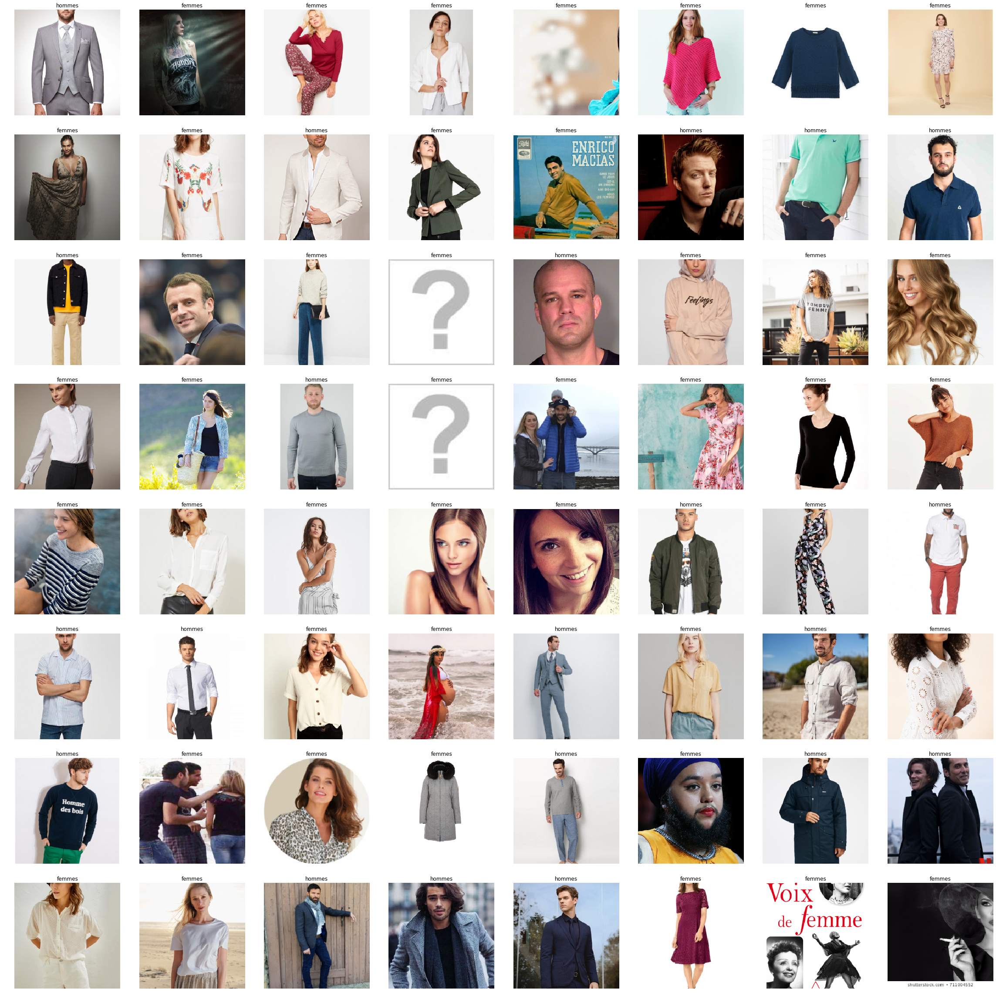

In [12]:
data.show_batch(9)

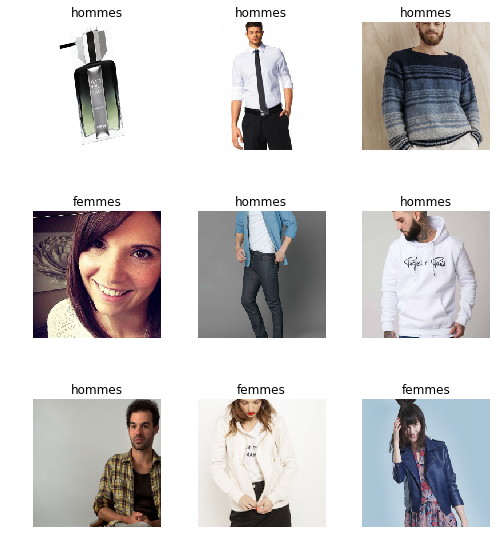

13. Regardez la taille de votre train set et la taille de votre test set 

In [13]:
print(len(data.train_ds))
data.test_ds

528


Nous avons ['femmes', 'hommes'] classes,
le train set fait 540 lignes et le test set fait 135 lignes


14. Créez un modèle resnet34 avec la metric ```accuracy``` pour voir ce que donne votre modèle 

In [14]:
learn = cnn_learner(data, models.resnet34, metrics=accuracy)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:03<00:00, 23.9MB/s]


15. Entrainez le sur 4 epochs

In [15]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,accuracy,time
0,0.824606,0.547556,0.832061,00:19
1,0.603354,0.618627,0.839695,00:18
2,0.437970,0.599506,0.862595,00:18
3,0.331595,0.590853,0.847328,00:18


epoch,train_loss,valid_loss,accuracy,time
0,0.786352,0.492009,0.755556,03:35
1,0.571720,0.295330,0.874074,03:39
2,0.460366,0.306046,0.888889,03:37
3,0.402385,0.304525,0.888889,03:35


16. Pour éviter de perdre votre modèle pré-entrainé, vous pouvez le sauvegarder va la méthode [.save()](https://docs.fast.ai/basic_train.html#Saving-and-loading-models)

In [0]:
learn.save("/content/learner")

17. Trouvez votre learning rate optimal 

In [19]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 1.32E-06
Min loss divided by 10: 6.31E-04


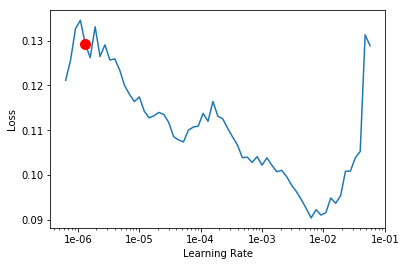

In [22]:
learn.recorder.plot(suggestion=True)

Min numerical gradient: 7.59E-07


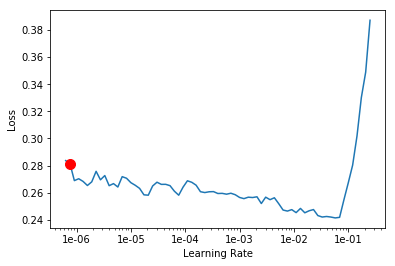

18. Ré-entrainez votre modèle 

In [23]:
learn.fit_one_cycle(4, 5E-03)

epoch,train_loss,valid_loss,accuracy,time
0,0.136291,0.609608,0.847328,00:17
1,0.162956,0.603750,0.862595,00:18
2,0.133826,0.646929,0.877863,00:18
3,0.107487,0.641331,0.877863,00:18


epoch,train_loss,valid_loss,accuracy,time
0,0.209185,0.305758,0.888889,04:51
1,0.221485,0.306813,0.888889,04:52
2,0.237812,0.307671,0.888889,04:51
3,0.237666,0.301391,0.896296,04:50


19. Il semblerait que nous ayons atteint déjà un très bon score. Voyons si nous pouvons aller encore plus loin en répétant l'opération 

In [24]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 1.58E-06
Min loss divided by 10: 6.31E-08


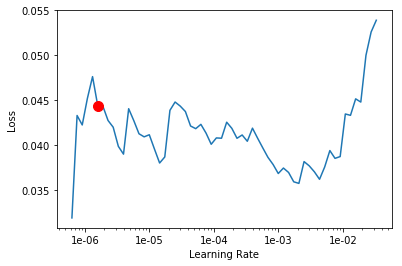

In [25]:
learn.recorder.plot(suggestion=True)

Min numerical gradient: 4.79E-06


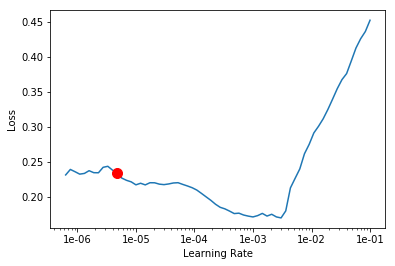

In [28]:
learn.fit_one_cycle(4, 1E-03)

epoch,train_loss,valid_loss,accuracy,time
0,0.058048,0.625785,0.877863,00:17
1,0.051222,0.615410,0.893130,00:17
2,0.040860,0.630058,0.885496,00:18
3,0.044453,0.637254,0.893130,00:18


epoch,train_loss,valid_loss,accuracy,time
0,0.214389,0.298306,0.896296,04:52
1,0.206198,0.295889,0.896296,04:51
2,0.209883,0.287647,0.896296,04:52
3,0.203839,0.287155,0.903704,04:51


20. Nos résultats ont l'air extrêmement satisfaisants ! Voyons-en quelques uns 

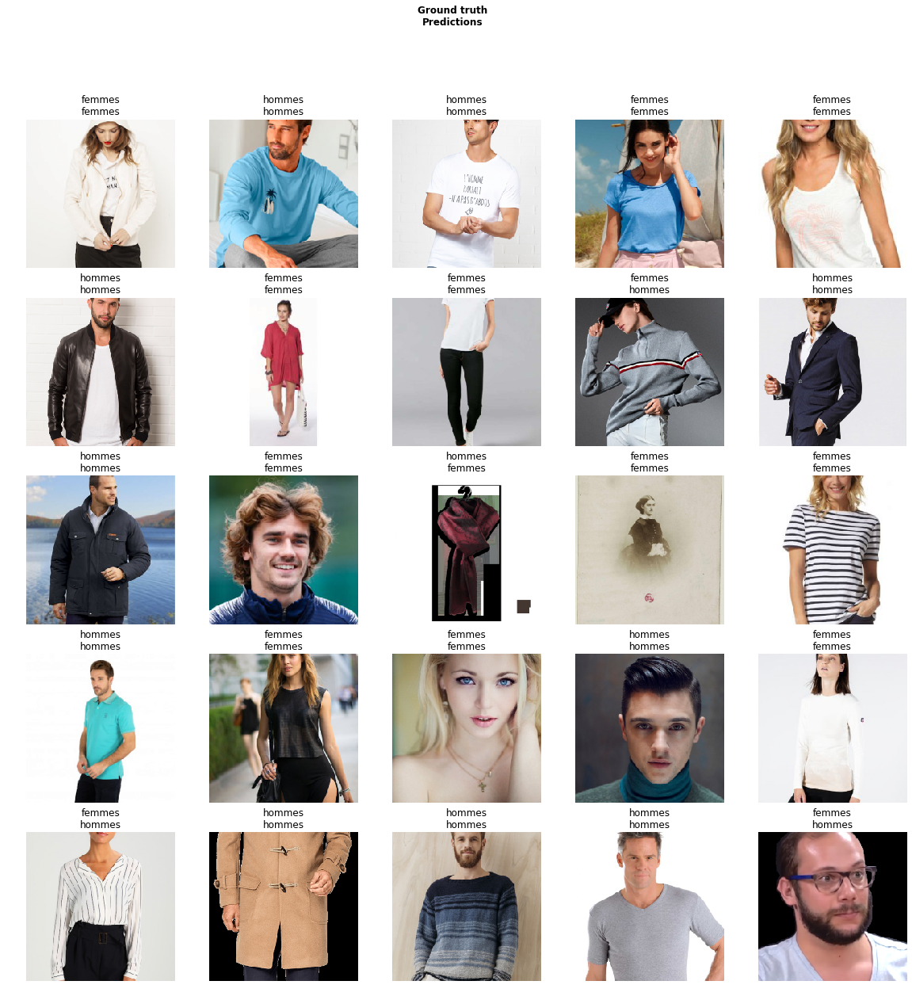

In [29]:
learn.show_results()

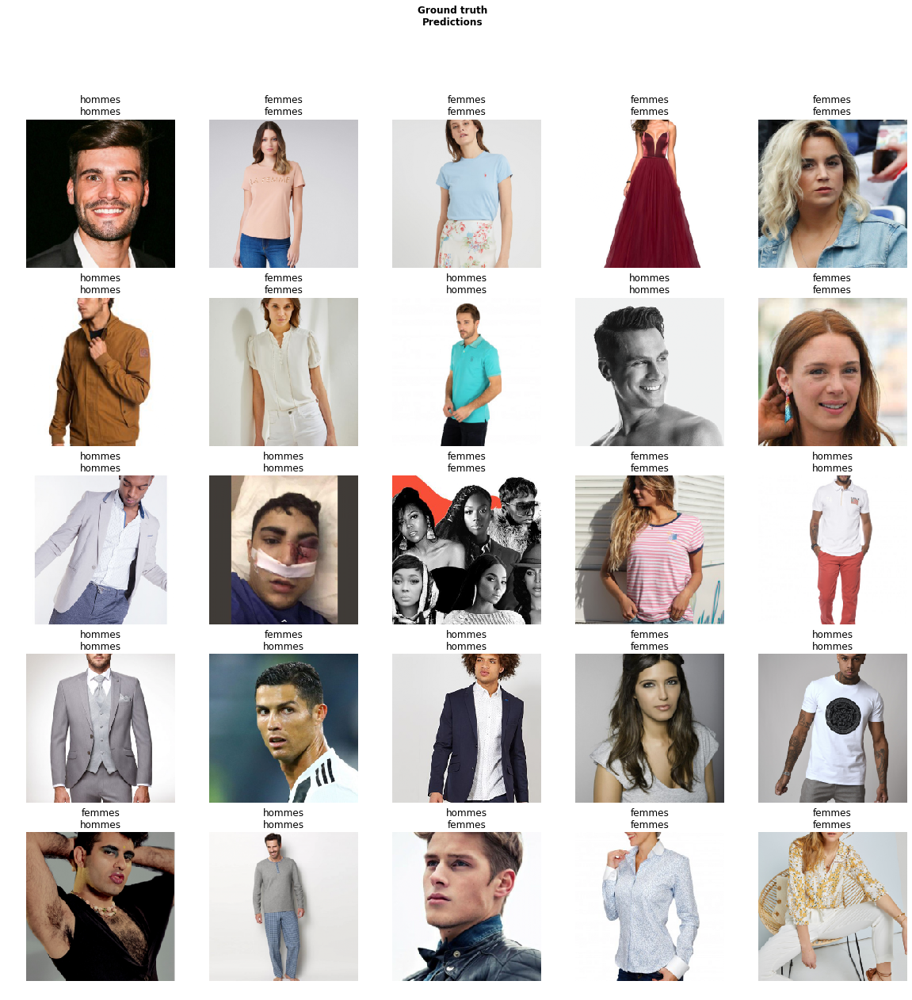

21. Créez un interpréteur pour qu'on puisse analyser nos résultats 

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

22. Sortez les images où le modèle s'est le plus trompé 

<bound method Interpretation.top_losses of <fastai.train.ClassificationInterpretation object at 0x7f7a1991df28>>

[('hommes', 'femmes', 7), ('femmes', 'hommes', 6)]

23. Graphez une matrice de confusion 

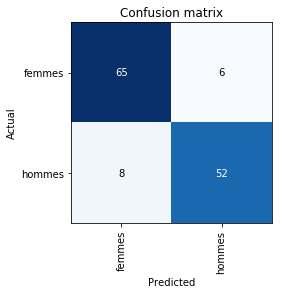

In [31]:
interp.plot_confusion_matrix()

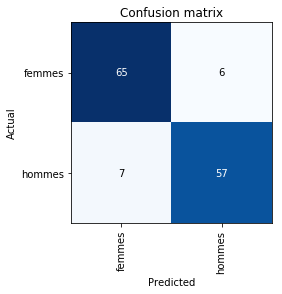